In [1]:
from __future__ import division, print_function, unicode_literals

In [2]:
MPI_Parallelization=['Active','InActive'][1]
Save_Results=['Active','InActive'][0]

## Inputs

In [3]:

Ng=128; # number of grid points in the DNS setup
Np=16; # number of processor used to run DNS (number of output files in each realization)
"""
the DNS data generated by a pecnil decomposition. For instance for Ng=16, we would have nx=4,ny=4,nz=1. 
Aslo, in this 2d decomposition, we have (rank0,rank3,rank12,rank15)=(top left, top right, bottom left, bottom right)
"""
DNSdata_time_Step=[5550, 5700, 5850, 6000, 15450][3] # a random realization (time step) that we want to visualize/post-process

Case_ID={'Re':90,'Fr':'\infty','TStep':75,'TStep_B':5025,'TStep_E':15000}
Version='01'
read_in_folder='data_DNS_Npr_16' # folder that we read in the data from
file_names_leading='Phy_Vel_VelG.'

## Import Libraries

In [4]:
# Import the required modules
import numpy as np
import matplotlib.pyplot as plt
# This makes the plots appear inside the notebook
#%matplotlib inline
from scipy.integrate import odeint
from scipy.integrate import solve_ivp
import os
import sys 
from scipy.linalg import expm, sinm, cosm
#import odespy, numpy
import time
import pickle
import argparse
import pandas as pd
from decimal import Decimal
# Read HDF5
import h5py
from matplotlib.colors import ListedColormap
import matplotlib.animation as animation
from IPython.display import HTML
if MPI_Parallelization=='InActive':
     Case_Ids=np.arange(0)
    
else:
    from mpi4py import MPI
    comm = MPI.COMM_WORLD
    Case_Ids=np.arange(comm.size)

In [5]:
#from matplotlib.pyplot import *

# Changing font to stix; setting specialized math font properties as directly as possible
#from matplotlib import rc
#rc('text', usetex=True)
plt.rcParams['mathtext.fontset'] = 'custom'
#rcParams['mathtext.it'] = 'STIXGeneral:italic'
plt.rcParams['mathtext.bf'] = 'STIXGeneral:bold'

plt.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]

## Reading/Saving Directory

In [6]:
def format_e(n):
    a = '%E' % n
    return a.split('E')[0].rstrip('0').rstrip('.') + 'E' + a.split('E')[1]

# N_BVF_str=format_e(Decimal(str(N_BVF))).replace(".", "p")
# tstep_str=format_e(Decimal(str(tstep))).replace(".", "p")

In [7]:
PROJECT_ROOT_DIR = "."
PROJECT_Read_DIR=read_in_folder
PROJECT_SAVE_DIR = "PPResults_Turbulence_"+Version
#makes the directory if it doesn't exist.

if MPI_Parallelization=='InActive':
    if not (os.path.isdir(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR)):
        print('Saving directory didn\'t exist, creating now.')
        os.mkdir(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR)
    else:
        print('Saving directory exists.') 

else:
    if comm.rank == 0:
        if not (os.path.isdir(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR)):
            print('Saving directory didn\'t exist, creating now.')
            os.mkdir(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR)
        else:
            print('Saving directory exists.') 
        
        
        
#a simple defined helper function.
def savepdf(fig,name):
    fig.savefig(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR+'/'+name+'.pdf',transparent=True) 
def savepng(fig,name):
    fig.savefig(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR+'/'+name+'.png')    
def save_obj(obj, obj_name):
    with open(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR+'/'+ obj_name+ '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(obj_name):
    with open(PROJECT_ROOT_DIR+'/'+PROJECT_SAVE_DIR+'/'+ obj_name+'.pkl', 'rb') as f:
        return pickle.load(f)    

Saving directory exists.


## Read in data

In [8]:


U_Phy=np.zeros((Ng,Ng,Ng))
V_Phy=np.zeros_like(U_Phy)
W_Phy=np.zeros_like(U_Phy)


row_coordinate=np.zeros_like(U_Phy).astype(int) # row direction
col_coordinate=np.zeros_like(U_Phy).astype(int) # column direction
dep_coordinate=np.zeros_like(U_Phy).astype(int) # depth direction


file_TimeStep=('%06.0f' % Decimal(DNSdata_time_Step))

for b in range(Np): 
    file_Rank=('%06.0f' % Decimal(b))
    filename=(file_names_leading+file_TimeStep+'.h5.'+file_Rank)
    
    
    print(filename)
    f = h5py.File(PROJECT_Read_DIR+'/'+filename, 'r')
    
    
    i_cell_ID= f['i_cell_ID'] # varies in depth
    j_cell_ID= f['j_cell_ID'] # varies horizontally (from left to right)
    k_cell_ID= f['k_cell_ID'] # varies vertically (from top to bottom)
    
    i_cell_ID_max=np.amax(i_cell_ID )
    i_cell_ID_min=np.amin(i_cell_ID )
    j_cell_ID_max=np.amax(j_cell_ID )
    j_cell_ID_min=np.amin(j_cell_ID )
    k_cell_ID_max=np.amax(k_cell_ID )
    k_cell_ID_min=np.amin(k_cell_ID )
        
    row_coordinate[k_cell_ID_min-1:k_cell_ID_max, j_cell_ID_min-1:j_cell_ID_max, i_cell_ID_min-1:i_cell_ID_max]=k_cell_ID
    col_coordinate[k_cell_ID_min-1:k_cell_ID_max, j_cell_ID_min-1:j_cell_ID_max, i_cell_ID_min-1:i_cell_ID_max]=j_cell_ID
    dep_coordinate[k_cell_ID_min-1:k_cell_ID_max, j_cell_ID_min-1:j_cell_ID_max, i_cell_ID_min-1:i_cell_ID_max]=i_cell_ID
    
    U_Phy[k_cell_ID_min-1:k_cell_ID_max, j_cell_ID_min-1:j_cell_ID_max, i_cell_ID_min-1:i_cell_ID_max]=f['Phy_U'][:]
    V_Phy[k_cell_ID_min-1:k_cell_ID_max, j_cell_ID_min-1:j_cell_ID_max, i_cell_ID_min-1:i_cell_ID_max]=f['Phy_V'][:]
    W_Phy[k_cell_ID_min-1:k_cell_ID_max, j_cell_ID_min-1:j_cell_ID_max, i_cell_ID_min-1:i_cell_ID_max]=f['Phy_W'][:]

    f.close()
    

Phy_Vel_VelG.006000.h5.000000
Phy_Vel_VelG.006000.h5.000001
Phy_Vel_VelG.006000.h5.000002
Phy_Vel_VelG.006000.h5.000003
Phy_Vel_VelG.006000.h5.000004
Phy_Vel_VelG.006000.h5.000005
Phy_Vel_VelG.006000.h5.000006
Phy_Vel_VelG.006000.h5.000007
Phy_Vel_VelG.006000.h5.000008
Phy_Vel_VelG.006000.h5.000009
Phy_Vel_VelG.006000.h5.000010
Phy_Vel_VelG.006000.h5.000011
Phy_Vel_VelG.006000.h5.000012
Phy_Vel_VelG.006000.h5.000013
Phy_Vel_VelG.006000.h5.000014
Phy_Vel_VelG.006000.h5.000015


In [9]:
# just a quick check to see what (paramteres) we have in HDf5 files

import pyUSID as usid

print('-------------------------')
usid.hdf_utils.print_tree(h5py.File(PROJECT_Read_DIR+'/'+filename, 'r'))
print('-------------------------')

-------------------------
/
├ Phy_U
├ Phy_V
├ Phy_W
├ dUdxG
├ dUdyG
├ dUdzG
├ dVdxG
├ dVdyG
├ dVdzG
├ dWdxG
├ dWdyG
├ dWdzG
├ i_cell_ID
├ j_cell_ID
├ k_cell_ID
├ trace_A
-------------------------


## Plotting to check if the cordinates are as expected

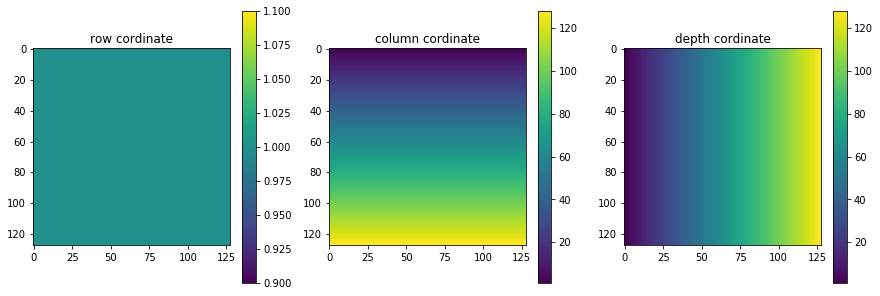

In [10]:
fig,ax=plt.subplots(nrows=1, ncols=3,figsize=(15,5))
i_d_min,i_d_max=0,1
j_d_min,j_d_max=0,Ng
k_d_min,k_d_max=0,Ng

plt.colorbar(ax[0].imshow(row_coordinate[i_d_min:i_d_max,j_d_min:j_d_max,k_d_min:k_d_max].squeeze()),ax=ax[0])
ax[0].set_title("row cordinate")
plt.colorbar(ax[1].imshow(col_coordinate[i_d_min:i_d_max,j_d_min:j_d_max,k_d_min:k_d_max].squeeze()),ax=ax[1])
ax[1].set_title("column cordinate")
plt.colorbar(ax[2].imshow(dep_coordinate[i_d_min:i_d_max,j_d_min:j_d_max,k_d_min:k_d_max].squeeze()),ax=ax[2])
ax[2].set_title("depth cordinate")
# ax[0].grid()
pass

### get a sense of data (histogram, etc.)

In [11]:
print("U_Phy.mean()=%f,V_Phy.mean()=%f,W_Phy.mean()=%f"%(U_Phy.mean(),V_Phy.mean(),W_Phy.mean()))
print("U_Phy.max()=%f,V_Phy.max()=%f,W_Phy.max()=%f"%(U_Phy.max(),V_Phy.max(),W_Phy.max()))
print("U_Phy.min()=%f,V_Phy.min()=%f,W_Phy.min()=%f"%(U_Phy.min(),V_Phy.min(),W_Phy.min()))

U_Phy.mean()=0.010089,V_Phy.mean()=0.015046,W_Phy.mean()=-0.001376
U_Phy.max()=4.156372,V_Phy.max()=3.657161,W_Phy.max()=3.448432
U_Phy.min()=-4.076104,V_Phy.min()=-4.295262,W_Phy.min()=-3.711889


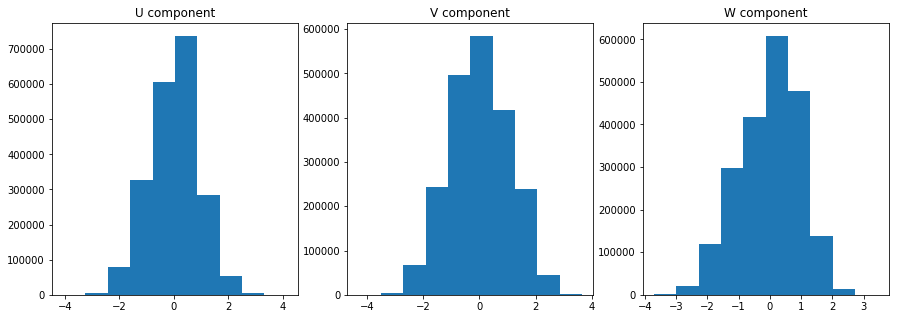

In [12]:
fig,axes=plt.subplots(1,3,figsize=(15,5))
axes[0].hist(U_Phy.ravel())
axes[0].set_title("U component")
axes[1].hist(V_Phy.ravel())
axes[1].set_title("V component")
axes[2].hist(W_Phy.ravel())
axes[2].set_title("W component")
pass

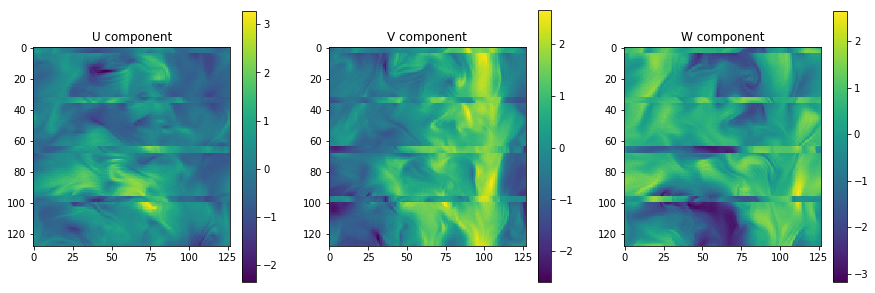

In [13]:
fig,ax=plt.subplots(nrows=1, ncols=3,figsize=(15,5))
i_d_min,i_d_max=5,6
j_d_min,j_d_max=0,Ng
k_d_min,k_d_max=1,Ng

plt.colorbar(ax[0].imshow(U_Phy[i_d_min:i_d_max,j_d_min:j_d_max,k_d_min:k_d_max].squeeze()),ax=ax[0])
ax[0].set_title("U component")
plt.colorbar(ax[1].imshow(V_Phy[i_d_min:i_d_max,j_d_min:j_d_max,k_d_min:k_d_max].squeeze()),ax=ax[1])
ax[1].set_title("V component")
plt.colorbar(ax[2].imshow(W_Phy[i_d_min:i_d_max,j_d_min:j_d_max,k_d_min:k_d_max].squeeze()),ax=ax[2])
ax[2].set_title("W component")
# ax[0].grid()
pass

In [23]:
%%capture
from mpl_toolkits.axes_grid1 import make_axes_locatable
steps=Ng
sim=U_Phy
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
im = plt.imshow(sim[0])
cb = fig.colorbar(im)
tx = ax.set_title('Frame 0')
def updatefig(j):
    im.set_array(sim[j])
    im.set_clim(np.min(sim), np.max(sim))
    tx.set_text('Frame {0}'.format(j))
    return [im]

ani = animation.FuncAnimation(fig, updatefig, frames=range(steps), 
                              interval=1000, blit=False);


In [24]:
HTML(ani.to_jshtml())

### Open problem!! trying to resolve the issue of lack of smoothness in imshow

In [22]:
for i in range(10):
    print("i=",i)
    print("U_Phy.mean()=%f,V_Phy.mean()=%f,W_Phy.mean()=%f"%(U_Phy[i].mean(),V_Phy[i].mean(),W_Phy[i].mean()))
    print("U_Phy.max()=%f,V_Phy.max()=%f,W_Phy.max()=%f"%(U_Phy[i].max(),V_Phy[i].max(),W_Phy[i].max()))
    print("U_Phy.min()=%f,V_Phy.min()=%f,W_Phy.min()=%f"%(U_Phy[i].min(),V_Phy[i].min(),W_Phy[i].min()))

i= 0
U_Phy.mean()=0.292989,V_Phy.mean()=0.456882,W_Phy.mean()=0.000000
U_Phy.max()=3.603607,V_Phy.max()=3.151327,W_Phy.max()=4.062622
U_Phy.min()=-2.805938,V_Phy.min()=-1.882131,W_Phy.min()=-3.561507
i= 1
U_Phy.mean()=0.302131,V_Phy.mean()=0.489792,W_Phy.mean()=0.000000
U_Phy.max()=3.620549,V_Phy.max()=3.440337,W_Phy.max()=4.147521
U_Phy.min()=-2.829669,V_Phy.min()=-1.888655,W_Phy.min()=-3.587047
i= 2
U_Phy.mean()=0.314274,V_Phy.mean()=0.534983,W_Phy.mean()=-0.000000
U_Phy.max()=3.709047,V_Phy.max()=3.574955,W_Phy.max()=4.153198
U_Phy.min()=-2.857833,V_Phy.min()=-2.025949,W_Phy.min()=-3.618666
i= 3
U_Phy.mean()=0.319628,V_Phy.mean()=0.583418,W_Phy.mean()=0.000000
U_Phy.max()=3.699928,V_Phy.max()=3.688985,W_Phy.max()=4.243071
U_Phy.min()=-3.011328,V_Phy.min()=-2.043132,W_Phy.min()=-3.595218
i= 4
U_Phy.mean()=0.324361,V_Phy.mean()=0.628988,W_Phy.mean()=0.000000
U_Phy.max()=3.722737,V_Phy.max()=3.725239,W_Phy.max()=4.385511
U_Phy.min()=-2.970799,V_Phy.min()=-1.806404,W_Phy.min()=-3.579118

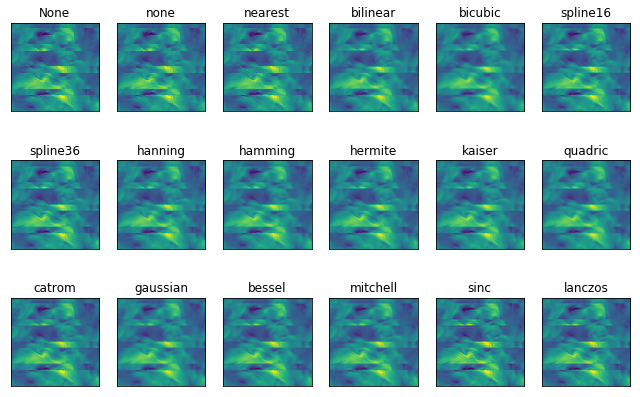

In [27]:
grid=U_Phy[1]
methods = [None, 'none', 'nearest', 'bilinear', 'bicubic', 'spline16',
           'spline36', 'hanning', 'hamming', 'hermite', 'kaiser', 'quadric',
           'catrom', 'gaussian', 'bessel', 'mitchell', 'sinc', 'lanczos']

# Fixing random state for reproducibility
np.random.seed(19680801)

#grid = np.random.rand(4, 4)

fig, axs = plt.subplots(nrows=3, ncols=6, figsize=(9, 6),
                        subplot_kw={'xticks': [], 'yticks': []})

for ax, interp_method in zip(axs.flat, methods):
    ax.imshow(grid, interpolation=interp_method, cmap='viridis')
    ax.set_title(str(interp_method))

plt.tight_layout()
plt.show()

## FFT and (low pass) Filtering
#### at some point we need to do this analysis as well. I will complete this part later./

In [28]:
data_t=U_Phy.copy()

In [29]:
# simple tests to make sure the fft library is working as expected
np.allclose(data_t,np.fft.ifftn(np.fft.fftn(data_t))),np.allclose(np.fft.fftn( data_t ) , np.fft.fftn( data_t,axes=(0,1,2) ) )

(True, True)

In [30]:
eta=1.46/55.8
print("eta=",eta)
factor_I_L=[1/2,1/4][0]
cut_off_freq=(0.1)*(factor_I_L)/(eta)
print("cut_off_freq=",cut_off_freq)

eta= 0.026164874551971327
cut_off_freq= 1.9109589041095891


In [31]:
Box_Length=2*np.pi
Nx=Ny=Nz=Ng
lx=ly=lz=Box_Length
Wavenumber_type=['type_paper','type_reality'][1] # I am not sure which approach is correct. I will keep thinking about it

In [32]:
if Wavenumber_type=='type_reality':
    kx=np.fft.fftfreq(Nx, d=(lx/Nx));
    ky=np.fft.fftfreq(Ny, d=(ly/Ny));
    kz=np.fft.rfftfreq(Nz, d=(lz/Nz)); # last dimension conjugate symmetric in numpy
    kxmesh,kymesh,kzmesh=np.meshgrid(kx,ky,kz,indexing='ij');
else:    # Wavenumber_type=='type_paper'
    Nf = Ng//2+1
    kx = ky = np.fft.fftfreq (Ng , 1./ Ng).astype( int )
    kz = kx [: Nf ].copy(); 
    kz[-1] *= -1
    kxmesh,kymesh,kzmesh = np.array ( np.meshgrid ( kx , ky , kz ,indexing ='ij') , dtype = int )      

In [38]:
kx,np.fft.fftfreq (Ng , 1./ Ng)

(array([  0.        ,   0.15915494,   0.31830989,   0.47746483,
          0.63661977,   0.79577472,   0.95492966,   1.1140846 ,
          1.27323954,   1.43239449,   1.59154943,   1.75070437,
          1.90985932,   2.06901426,   2.2281692 ,   2.38732415,
          2.54647909,   2.70563403,   2.86478898,   3.02394392,
          3.18309886,   3.3422538 ,   3.50140875,   3.66056369,
          3.81971863,   3.97887358,   4.13802852,   4.29718346,
          4.45633841,   4.61549335,   4.77464829,   4.93380324,
          5.09295818,   5.25211312,   5.41126807,   5.57042301,
          5.72957795,   5.88873289,   6.04788784,   6.20704278,
          6.36619772,   6.52535267,   6.68450761,   6.84366255,
          7.0028175 ,   7.16197244,   7.32112738,   7.48028233,
          7.63943727,   7.79859221,   7.95774715,   8.1169021 ,
          8.27605704,   8.43521198,   8.59436693,   8.75352187,
          8.91267681,   9.07183176,   9.2309867 ,   9.39014164,
          9.54929659,   9.70845153,   9.

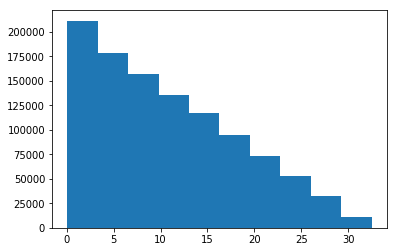

In [33]:
k_abs=np.sqrt(kxmesh*kxmesh*kzmesh)
k_abs=np.where(k_abs==0,1,k_abs)
plt.hist(k_abs.ravel())
pass

In [34]:
Low_pass_filter = np.array ( ( abs (k_abs) < cut_off_freq ) , dtype = bool )
filtered_data_t=np.fft.irfftn(np.fft.rfftn(data_t)*Low_pass_filter)

In [35]:
%%capture
from mpl_toolkits.axes_grid1 import make_axes_locatable
steps=Ng
sim=filtered_data_t
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111)
im = plt.imshow(sim[0])
cb = fig.colorbar(im)
tx = ax.set_title('Frame 0')
def updatefig(j):
    im.set_array(sim[j])
    im.set_clim(np.min(sim), np.max(sim))
    tx.set_text('Frame {0}'.format(j))
    return [im]

ani = animation.FuncAnimation(fig, updatefig, frames=range(steps), 
                              interval=1000, blit=False);

In [36]:
HTML(ani.to_jshtml())